1. Understanding BERT And XLM-RoBERTa

Objective: Learn how transformer models work and their role in NLP tasks.

Instructions:

Read through the descriptions of BERT and XLM-RoBERTa.
Understand how these models process text using tokenization.
Learn about different pre-trained versions of these models and their characteristics.

In [8]:
from transformers import BertTokenizer, XLMRobertaTokenizer

2. Tokenizing Text

Objective: Understand how to tokenize text using pre-trained tokenizers.

Instructions:

Use the BertTokenizer and XLMRobertaTokenizer to convert sentences into tokenized input.
Explore the different token types, such as input_ids, attention_mask, and labels.
Experiment with single-sentence and two-sentence tokenization.

In [9]:
bert_tokenizer = BertTokenizer.from_pretrained("google-bert/bert-base-multilingual-cased")
roberta_tokenizer = XLMRobertaTokenizer.from_pretrained("FacebookAI/xlm-roberta-base")

In [10]:
#Results with BERT

# One sentence
sentence = "Transformers are powerful."

# encode_plus gives you structured info about the tokenized input
encoded = bert_tokenizer.encode_plus(
    sentence,
    return_tensors=None,  # for clarity; remove batching
    return_attention_mask=True,
    return_token_type_ids=True
)

print("Input IDs:", encoded["input_ids"])
print("Attention Mask:", encoded["attention_mask"])
print("Token Type IDs:", encoded["token_type_ids"])  # Only for BERT

#Sentence Pair
pair = bert_tokenizer.encode_plus("Cats are amazing.", "They are very independent.", return_token_type_ids=True)
print("Sentence pair - token_type_ids:", pair["token_type_ids"])

#Use decode() to see how the model views inputs
input_ids = pair["input_ids"]
decoded = bert_tokenizer.decode(input_ids)
print("Decoded input:", decoded)

Input IDs: [101, 64562, 10301, 29481, 119, 102]
Attention Mask: [1, 1, 1, 1, 1, 1]
Token Type IDs: [0, 0, 0, 0, 0, 0]
Sentence pair - token_type_ids: [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]
Decoded input: [CLS] Cats are amazing. [SEP] They are very independent. [SEP]


In [11]:
#Results with XLMRoberta

# One sentence
sentence = "Transformers are powerful."

# encode_plus gives you structured info about the tokenized input
encoded = roberta_tokenizer.encode_plus(
    sentence,
    return_tensors=None,  # for clarity; remove batching
    return_attention_mask=True,
    return_token_type_ids=True
)

print("Input IDs:", encoded["input_ids"])
print("Attention Mask:", encoded["attention_mask"])
print("Token Type IDs:", encoded["token_type_ids"])  # Only for BERT

#Sentence Pair
pair = roberta_tokenizer.encode_plus("Cats are amazing.", "They are very independent.", return_token_type_ids=True)
print("Sentence pair - token_type_ids:", pair["token_type_ids"])

#Use decode() to see how the model views inputs
input_ids = pair["input_ids"]
decoded = roberta_tokenizer.decode(input_ids)
print("Decoded input:", decoded)

Input IDs: [0, 11062, 82772, 7, 621, 113138, 5, 2]
Attention Mask: [1, 1, 1, 1, 1, 1, 1, 1]
Token Type IDs: [0, 0, 0, 0, 0, 0, 0, 0]
Sentence pair - token_type_ids: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Decoded input: <s> Cats are amazing.</s></s> They are very independent.</s>


3. Preparing Input Data For The Model

Objective: Format input data correctly for transformer models.

Instructions:

Ensure that input sentences are padded and possibly truncated to max_length.
Understand and set special tokens such as <s> and </s>.
Learn about attention_mask and how it helps the model ignore padding tokens.
Functions to use:

tokenizer.encode_plus()
tokenizer.special_tokens_map
tokenizer.vocab_size

In [12]:
def prepare_input(text1, text2=None, tokenizer=None, max_length=32):
    """
    Prepares one or two sentences for transformer input.

    Args:
        text1 (str): The first sentence.
        text2 (str, optional): The second sentence (for paired input).
        tokenizer (Tokenizer): BERT or XLM-R tokenizer.
        max_length (int): Max length of tokenized input.

    Returns:
        dict: Dictionary with input_ids, attention_mask, and optionally token_type_ids.
    """
    encoded = tokenizer.encode_plus(
        text1,
        text2,
        add_special_tokens=True,
        padding='max_length',
        truncation=True,
        max_length=max_length,
        return_attention_mask=True,
        return_token_type_ids=True,
        return_tensors="pt"
    )

    return encoded

4. Loading And Exploring The Dataset

Objective: Load the dataset and explore its structure.

Instructions:

Load the training and testing data from CSV files.
Display the first few rows to understand its structure.
Identify the columns needed for training the model.
Functions to use:

pd.read_csv()
df.head()
df.shape

In [13]:
import pandas as pd

In [14]:
# Load CSV files
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

# Quick look at structure
print(train_df.shape)
print(train_df.head())

#columns needed for training the model
text1_col = "premise"
text2_col = "hypothesis"
label_col= "label"

(12120, 6)
           id                                            premise  \
0  5130fd2cb5  and these comments were considered in formulat...   
1  5b72532a0b  These are issues that we wrestle with in pract...   
2  3931fbe82a  Des petites choses comme celles-là font une di...   
3  5622f0c60b  you know they can't really defend themselves l...   
4  86aaa48b45  ในการเล่นบทบาทสมมุติก็เช่นกัน โอกาสที่จะได้แสด...   

                                          hypothesis lang_abv language  label  
0  The rules developed in the interim were put to...       en  English      0  
1  Practice groups are not permitted to work on t...       en  English      2  
2              J'essayais d'accomplir quelque chose.       fr   French      0  
3  They can't defend themselves because of their ...       en  English      0  
4    เด็กสามารถเห็นได้ว่าชาติพันธุ์แตกต่างกันอย่างไร       th     Thai      1  


5. Creating Cross-Validation Folds

Objective: Implement k-fold cross-validation for training.

Instructions:

Use StratifiedKFold to create 5 training-validation splits.
Ensure that each fold maintains the same label distribution.
Store the training and validation splits in separate lists.
Functions to use:

from sklearn.model_selection import StratifiedKFold
kf.split()
StratifiedKFold(shuffle=True)

In [15]:
from sklearn.model_selection import StratifiedKFold

def create_stratified_folds(df, label_col, n_splits=5, shuffle=True, random_state=42):
    """
    Splits the data into stratified k-folds.

    Args:
        df (pd.DataFrame): Input DataFrame containing text and labels.
        label_col (str): Name of the column containing labels.
        n_splits (int): Number of folds.
        shuffle (bool): Whether to shuffle before splitting.
        random_state (int): Random seed for reproducibility.

    Returns:
        List of (train_idx, val_idx) tuples.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    folds = []

    for train_idx, val_idx in skf.split(df, df[label_col]):
        folds.append((train_idx, val_idx))

    return folds

Step 1: Dataset Class using prepare_input()




In [16]:
from torch.utils.data import Dataset

class NLI_Dataset(Dataset):
    def __init__(self, df, tokenizer, max_length=32):
        self.df = df
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        encoded = prepare_input(
            row["premise"],
            row["hypothesis"],
            tokenizer=self.tokenizer,
            max_length=self.max_length
        )
        encoded["labels"] = torch.tensor(row["label"], dtype=torch.long)
        return {k: v.squeeze(0) for k, v in encoded.items()}

Step 2: Load Model

In [17]:
from transformers import XLMRobertaForSequenceClassification

model = XLMRobertaForSequenceClassification.from_pretrained("xlm-roberta-base", num_labels=3)

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step 3: Create Train/Val Sets From Your Folds

In [18]:
import torch
from torch.utils.data import DataLoader
import numpy as np

# Create folds
folds = create_stratified_folds(train_df, label_col=label_col)
train_idx, val_idx = folds[0]  # first fold

# Split the dataframe
train_data = train_df.iloc[train_idx].reset_index(drop=True)
val_data = train_df.iloc[val_idx].reset_index(drop=True)

# Dataset + Dataloader
train_dataset = NLI_Dataset(train_data, roberta_tokenizer)
val_dataset = NLI_Dataset(val_data, roberta_tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16)

Step 4: Training Loop

In [19]:
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm  # Optional, for progress bar

import torch

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")

model.to(device)

optimizer = optim.Adam(model.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()  # Not directly used if model returns loss, but can keep it

train_accuracies = []
train_losses = []
val_losses = []
val_accuracies = []

best_val_loss = float('inf')
patience = 3       # number of epochs to wait for improvement
epochs_no_improve = 0
early_stop = False
max_epochs = 20    # you can increase your max epochs here

correct_train = 0
total_train = 0
total_train_loss = 0

for epoch in range(max_epochs):
    if early_stop:
        print(f"Early stopping triggered at epoch {epoch}")
        break

    model.train()
    total_train_loss = 0
    correct_train = 0      # Reset at start of each epoch
    total_train = 0        # Reset at start of each epoch

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1} Training"):
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["labels"].to(device)

        optimizer.zero_grad()
        outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

        predictions = torch.argmax(logits, dim=1)
        correct_train += (predictions == labels).sum().item()
        total_train += labels.size(0)

    avg_train_loss = total_train_loss / len(train_loader)
    avg_train_acc = correct_train / total_train
    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_acc)
    print(f"Epoch {epoch+1} | Train Loss: {avg_train_loss:.4f}")

    # Validation
    model.eval()
    total_val_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["labels"].to(device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            val_loss = outputs.loss
            logits = outputs.logits

            total_val_loss += val_loss.item()

            predictions = torch.argmax(logits, dim=1)
            correct += (predictions == labels).sum().item()
            total += labels.size(0)

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    accuracy = correct / total
    val_accuracies.append(accuracy)

    print(f"Validation Loss: {avg_val_loss:.4f} | Validation Accuracy: {accuracy:.4f}")

    # Early stopping logic
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "best_model.pt")  # save best model
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            early_stop = True

Using device: mps


Epoch 1 Training:   0%|          | 0/606 [00:00<?, ?it/s]Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not re

Epoch 1 | Train Loss: 1.1030


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai

Validation Loss: 1.0999 | Validation Accuracy: 0.3350


Epoch 2 Training:   0%|          | 0/606 [00:00<?, ?it/s]Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not re

Epoch 2 | Train Loss: 1.1018


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai

Validation Loss: 1.0983 | Validation Accuracy: 0.3350


Epoch 3 Training:   0%|          | 0/606 [00:00<?, ?it/s]Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not re

Epoch 3 | Train Loss: 1.1024


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai

Validation Loss: 1.0983 | Validation Accuracy: 0.3449


Epoch 4 Training:   0%|          | 0/606 [00:00<?, ?it/s]Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not re

Epoch 4 | Train Loss: 1.1024


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai

Validation Loss: 1.0982 | Validation Accuracy: 0.3449


Epoch 5 Training:   0%|          | 0/606 [00:00<?, ?it/s]Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not re

Epoch 5 | Train Loss: 1.1021


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai

Validation Loss: 1.0994 | Validation Accuracy: 0.3350


Epoch 6 Training:   0%|          | 0/606 [00:00<?, ?it/s]Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not re

Epoch 6 | Train Loss: 1.1021


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai

Validation Loss: 1.0982 | Validation Accuracy: 0.3449


Epoch 7 Training:   0%|          | 0/606 [00:00<?, ?it/s]Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not re

Epoch 7 | Train Loss: 1.1011


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai

Validation Loss: 1.0988 | Validation Accuracy: 0.3350
Early stopping triggered at epoch 7


Step 5: Evaluation and Visualisation of Performance

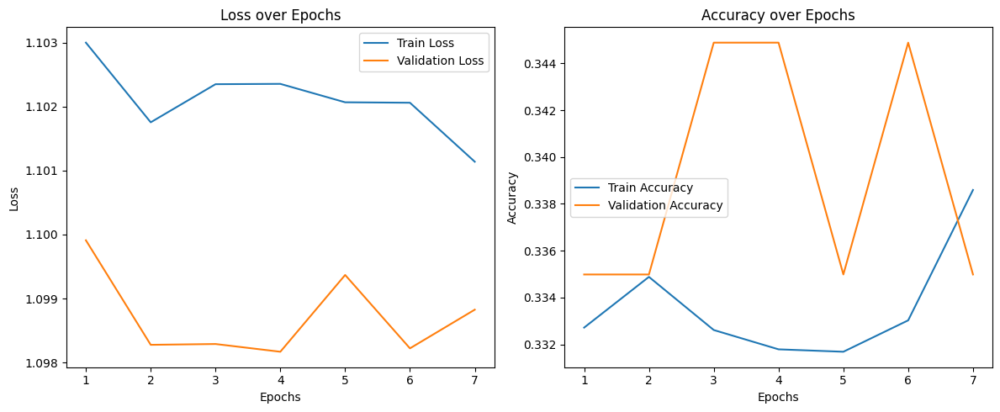

In [20]:
import matplotlib.pyplot as plt

epochs_range = range(1, len(train_losses) + 1)

plt.figure(figsize=(12, 5))

# Loss subplot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()

# Accuracy subplot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_accuracies, label='Train Accuracy')
plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

Step 6: Inference on test_df

In [21]:
class TestDataset(Dataset):
    def __init__(self, df, tokenizer, max_length=32):
        self.df = df
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        encoded = prepare_input(row["premise"], row["hypothesis"], tokenizer=self.tokenizer, max_length=self.max_length)
        return {k: v.squeeze(0) for k, v in encoded.items()}

test_dataset = TestDataset(test_df, roberta_tokenizer)
test_loader = DataLoader(test_dataset, batch_size=16)

model.load_state_dict(torch.load("best_model.pt"))
model.to(device)
model.eval()
predictions = []

with torch.no_grad():
    for batch in test_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        preds = torch.argmax(outputs.logits, dim=1)
        predictions.extend(preds.cpu().numpy())

# Add predictions as a new column
test_df["predicted_label"] = predictions

# Save to CSV
test_df.to_csv("test_with_predictions.csv", index=False)


Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pairs with the 'longest_first' truncation strategy. So the returned list will always be empty even if some tokens have been removed.
Be aware, overflowing tokens are not returned for the setting you have chosen, i.e. sequence pai